In [1]:
!nvidia-smi
!pip install pytorch-lightning
!pip install bertviz

Tue Aug 17 14:25:04 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.57.02    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Preparing


*   fix bug of pytorch transformer framework
*   Connect to Gdrive



In [2]:
from google.colab import drive
drive.mount('/content/drive')

# repair pytorch 
!cp /content/drive/MyDrive/openstack/functional.py /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py
# after first copy, restart the notebook

# float 16

import math
import json
import os
import random

import sklearn

from tqdm.notebook import tqdm

from bertviz import head_view

import torch
from torch import Tensor
from typing import Optional
from torch.optim import Adam
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split

import pytorch_lightning as pl
from pytorch_lightning import LightningModule
from pytorch_lightning import LightningDataModule
from pytorch_lightning import Trainer
from pytorch_lightning.tuner.tuning import Tuner

pl.utilities.seed.seed_everything(1)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Global seed set to 1


1

# Model

In [3]:
pl.utilities.seed.seed_everything(1)

class LogOutlier(LightningModule):
    def __init__(self, ntoken, ninp, nhead, nhid, nlayers, dropout=0.2, padding_value = 512, target_value = 0,learning_rate = 0.01,lr_step_size = 50):
        super().__init__()
        # learning_rate
        self.learning_rate = learning_rate
        self.lr_step_size = lr_step_size

        self.ninp = ninp
        self.padding_value = padding_value
        self.target_value = target_value
        self.loss_function = nn.CrossEntropyLoss(reduction='none')
        # token embedding
        self.encoder = Embeddings(ninp, ntoken)
        # positional encoding
        self.pos_encoder = PositionalEncoding(ninp, dropout)

        # transformer encoder
        encoder_layers = TransformerEncoderLayerAttention(ninp, nhead, nhid, dropout)  # encoder_layer
        self.transformer_encoder = TransformerEncoderAttention(encoder_layers, nlayers)



        self.decoder = nn.Linear(ninp, ntoken)

        self.init_weights()

    def init_weights(self):
        initrange = 0.1  # original 0.1
        self.decoder.bias.data.zero_()
        self.decoder.weight.data.uniform_(-initrange, initrange)

    def forward(self, src, key_padding_mask, att_mask=None, require_attention=False, result_mask=None):
        #src = src.to(self.device)

        #mask
        src_key_padding_mask = (src == self.padding_value)
        output_mask = (src == self.target_value)
        # att_mask : for every sequence in batch is the same
        src = src.t()
        #

        # pos encoder suppose input begin with sequence length
        src = self.encoder(src)

        src = self.pos_encoder(src)
        # attention! transformer need different input structure, first place is not batch size

        output, attention_list = self.transformer_encoder(src, src_key_padding_mask=key_padding_mask, mask=att_mask)

        src = None

        # change back to normal shape
        # att_mask  size(batch_size, sequence length mask)
        output = output.permute(1, 0, 2)[result_mask]

        output = self.decoder(output)

        if require_attention:
            return output, attention_list
        else:
            return output

    def training_step(self, batch, batch_idx):
        # parsing input data 
        x = batch[0]
        y = batch[1]
        sample_weight = batch[3].to(self.device)

        # mask still on same device as x, dont need to move again
        src_key_padding_mask = (x == self.padding_value)
        output_mask = (x == self.target_value)


        logits = self(x, key_padding_mask = src_key_padding_mask, result_mask =output_mask )
        
        loss = self.loss_function(logits, y) #reduction set to none
                                             #right now it is a vector
        loss =(loss * sample_weight / sample_weight.sum()).sum()

        self.log('my_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.log('learning rate',self.optimizer.param_groups[0]['lr'], on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss
    
    def validation_step(self, batch, batch_idx):
        # parsing input data 
        x = batch[0]
        y = batch[1]
        sample_weight = batch[3].to(self.device)

        # mask still on same device as x, dont need to move again
        src_key_padding_mask = (x == self.padding_value)
        output_mask = (x == self.target_value)

        #+++++++++++#
        logits = self(x, key_padding_mask = src_key_padding_mask, result_mask =output_mask )   
        #+++++++++++#

        loss = self.loss_function(logits, y) #reduction set to none
                                             #right now it is a vector
        val_loss =(loss * sample_weight / sample_weight.sum()).sum()

        self.log("val_loss",val_loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return val_loss

    def configure_optimizers(self):
        self.optimizer = Adam(self.parameters(), lr=self.learning_rate)
        self.reduce_lr_on_plateau = torch.optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer,
            mode='min',
            factor=0.2,
            patience=6, #6
            min_lr=1e-6,
            verbose=True
        )
        self.scheduler = torch.optim.lr_scheduler.StepLR(self.optimizer,step_size=self.lr_step_size) #0.01 80
        #return {"optimizer": self.optimizer, "lr_scheduler": self.scheduler}
        return {"optimizer": self.optimizer, "lr_scheduler": self.reduce_lr_on_plateau, "monitor": "val_loss"}#frist list optimizer, second list scheduler
        #enable automatic learning rate find by trainer


class Embeddings(nn.Module):
    def __init__(self, d_model, vocab):
        # d_model = 0.25*vocab
        super(Embeddings, self).__init__()
        self.lut = nn.Embedding(vocab, d_model)
        self.d_model = d_model
        self.lut.weight.data.uniform_(-0.1, 0.1)

    def forward(self, x):
        return self.lut(x) * math.sqrt(self.d_model)


class PositionalEncoding(nn.Module):
    # input must be seq length
    def __init__(self, d_model, dropout=0.1, max_len=300):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :]
        return self.dropout(x)

from torch.nn import TransformerEncoder, TransformerEncoderLayer

class TransformerEncoderLayerAttention(TransformerEncoderLayer):
    def forward(self, src: Tensor, src_mask: Optional[Tensor] = None, src_key_padding_mask: Optional[Tensor] = None) :
            r"""Pass the input through the encoder layer.

            Args:
                src: the sequence to the encoder layer (required).
                src_mask: the mask for the src sequence (optional).
                src_key_padding_mask: the mask for the src keys per batch (optional).

            Shape:
                see the docs in Transformer class.
            """
            src2,attention_weight = self.self_attn(src, src, src, attn_mask=src_mask,
                                key_padding_mask=src_key_padding_mask)
            src = src + self.dropout1(src2)
            src = self.norm1(src)
            src2 = self.linear2(self.dropout(self.activation(self.linear1(src))))
            src = src + self.dropout2(src2)
            src = self.norm2(src)
            return src, attention_weight

class TransformerEncoderAttention(TransformerEncoder):
    def forward(self, src: Tensor, mask: Optional[Tensor] = None, src_key_padding_mask: Optional[Tensor] = None):
            r"""Pass the input through the encoder layers in turn.

            Args:
                src: the sequence to the encoder (required).
                mask: the mask for the src sequence (optional).
                src_key_padding_mask: the mask for the src keys per batch (optional).

            Shape:
                see the docs in Transformer class.
            """
            output = src
            attention_list = []

            for mod in self.layers:
                output,attention = mod(output, src_mask=mask, src_key_padding_mask=src_key_padding_mask)
                attention_list.append(attention.to(torch.device('cpu')))
                attention = None
            if self.norm is not None:
                output = self.norm(output)

            return output,attention_list

Global seed set to 1


# Define Dataset Class

In [4]:
pl.utilities.seed.seed_everything(1)


class sequence_generator(Dataset):
    def __init__(self,target_mask = 0, padding_number = 100, 
                 need_padding = False, version = 25, start = 37, end = 38):
        self.tokens = set()
        self.sequence = {} #e.g. 1: ('1 2 3 4',1000)
        self.max_length = 0 # key: instance_id value: template id sequences

        self.target_mask = target_mask
        self.padding_number = padding_number
        self.start_mask = 37
        self.end_mask = 38

        self.need_padding = need_padding
        self.version = version
        self.seq_data = []

            
    def update_Dataset(self,seqs = None ):
        if seqs == None:
            seqs = self.sequence

        # silde windows
        self.seq_data = []

        for key in seqs.keys():
            #convert each element in the list to integer 
            serie, counts = seqs[key]

            seq = [int(x) for x in serie.strip().split(' ')]
            # add start and end
            seq = [self.start_mask] + seq + [self.end_mask]

            for i in range(len(seq)):
                tmp_seq = seq.copy()
                #remeber target before using mask cover it
                tmp_target = tmp_seq[i]
                # mask the target key
                tmp_seq[i] = self.target_mask
                # cut to limited version is version parameter is given
                if self.version:
                    tmp_seq = tmp_seq[max(0,i-self.version):i+self.version]

                #single direction:
                #tmp_seq = tmp_seq[:i+1]

                #add (tmp_seq, tmp_target, key, counts) tuple to training data 
                self.seq_data.append((tmp_seq, tmp_target, key, counts))
    
    #Dataset special methods   
    def __len__(self):
        return len(self.seq_data)
    
    def __getitem__(self,idx):
        seq = self.seq_data[idx][0]
        target = self.seq_data[idx][1]
        id = self.seq_data[idx][2]
        counts = self.seq_data[idx][3]
        return seq, target, id, counts

Global seed set to 1


# Special Part For HDFS
----------------

# HDFS data preparation (before dataset)
    * specify loading function
    * specify dataset create function
    * dataloader functions
    * define target_mask, max_length, padding mask

In [5]:
pl.utilities.seed.seed_everything(1)
################

# loading function

################
#load hdfs #max token 36 (use it as padding)
def load_hdfs(path = '/content/drive/MyDrive/Deeplog/data/hdfs_train'):
    train_seq = {} 
    max_length = 0
    with open(path,'r') as data:
        for line in data:
            tmp = line.strip() # strip can remove white space and /n
            train_seq[tmp] = train_seq.get(tmp,0)+1 # count sequence times
        # weighted sample
        return train_seq

################

# dataset creating function

################
def hdfs_create_sg(seq_list,version = 25):
    #init
    hdfs_train_sq = sequence_generator(0,36,version= version)
    # convert dict to key value pairs
    if isinstance(seq_list,dict):
        seq_list = list(seq_list.items())
    train_dict = {}
    for i in range(len(seq_list)):
        train_dict[i] = seq_list[i] #e.g. 1: ('1 2 3 4',1000)
    hdfs_train_sq.sequence = train_dict 

    hdfs_train_sq.update_Dataset()
    return hdfs_train_sq


def padding(seq,padding_number,max_length):
    return seq+[padding_number]*(max_length-len(seq))


Global seed set to 1


# Function for Evaluation

    * outlier detection function

    * evaluate function

    * PR-AUC plot function





In [6]:
pl.utilities.seed.seed_everything(1)

####################################

# outlier detection function

####################################
def quick_outlier_detection(model, dataloader,top = 10):
    result = {}
    for x, y ,id, counts in tqdm(dataloader):
        # to device:
        x = x.to(model.device)
        y = y.to(model.device)
        #model predict
        src_key_padding_mask = (x == model.padding_value)
        # mask still on same device as x
        output_mask = (x == model.target_value)
        output = model(x, key_padding_mask = src_key_padding_mask, result_mask =output_mask )
        predict = torch.topk(output,top,dim = 1).indices
        #window level result
        #no one match is outlier
        predict = (predict != y.reshape(-1,1)).all(-1).int().to(torch.device('cpu')).tolist()
        id = id
        counts = counts.tolist()

        #update final result
        for pair in zip(id,predict):
            if pair[0] not in result:
                result[pair[0]] = pair[1]
            else:
                result[pair[0]] += pair[1]
    return result

######################################

# evaluation function

######################################
def with_different_threshold(hdfs_output,ground_truth,need_plot = False,sample_weight = None):    
    hdfs_predict = hdfs_output

    from sklearn.metrics import precision_recall_curve
    precision, recall, thresholds = precision_recall_curve(ground_truth, hdfs_predict,sample_weight= sample_weight)
    if need_plot:
        import matplotlib.pyplot as plt
        import seaborn as sns
        plt.figure(figsize=(10,10))
        ax = sns.lineplot(x = recall, y= precision)
        ax.set(xlabel='recall', ylabel='precision')
        ax.set(ylim=(0,1.01))
        ax.set(xlim=(0,1))
        plt.show()


    f1 = 0
    p = 0
    r = 0
    for i in range(len(precision)):
        f1_ = 2 * precision[i] * recall[i]/(precision[i]+recall[i])
        if f1_>f1:
            f1 = f1_
            p = precision[i]
            r = recall[i]
            threshold = thresholds[i]
    print('precision: ',p,' recall: ',r,' F1: ',f1,' thresholds: ',threshold)
    return (precision,recall,thresholds,ground_truth,hdfs_predict), f1


##########################################

# PR-AUC plot function

##########################################
def evaluation(hdfs_test_normal,hdfs_test_abnormal,device,model,top =1):
    pl.utilities.seed.seed_everything(1)
    test_dataloader_normal = DataLoader(hdfs_test_normal,1024,num_workers=0,collate_fn=collect_function)
    test_dataloader_abnormal = DataLoader(hdfs_test_abnormal,1024,num_workers=0,collate_fn=collect_function)
    ##normal
    #+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
    #predict
    pl.utilities.seed.seed_everything(1)
    model.eval()
    model.to(torch.device('cuda'))

    with torch.no_grad():
        normal_result = quick_outlier_detection(model,test_dataloader_normal,top = top)
    #------------------
    #get sample weight
    count_dict = {}
    for c in test_dataloader_normal:
        for m in zip(c[2],c[3].tolist()):
            count_dict[m[0]] = m[1]

    #-------------------
    # generate ground truth, normalize outlier score
    real0 = [0]*len(normal_result)
    predict0 = [normal_result[key]/len(hdfs_test_normal.sequence[key][0])for key in range(len(normal_result))]
    sample_weight0 = [count_dict[key] for key in range(len(count_dict))]

    ##abnormal
    #+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
    #predict
    model.eval()
    model.to(torch.device('cuda'))
    pl.utilities.seed.seed_everything(1)
    with torch.no_grad():
        abnormal_result = quick_outlier_detection(model,test_dataloader_abnormal,top=top)
    #-------------------
    #get sample weight
    count_dict = {}
    for c in test_dataloader_abnormal:
        for m in zip(c[2],c[3].tolist()):
            count_dict[m[0]] = m[1]
    #--------------------
    # generate ground truth, normalize outlier score
    real1 = [1]*len(abnormal_result)
    predict1 = [abnormal_result[key]/len(hdfs_test_abnormal.sequence[key][0])for key in range(len(abnormal_result))]
    sample_weight1 = [count_dict[key] for key in range(len(count_dict))]

    #return prediction, real, sample_weight
    return predict0+predict1, real0+real1, sample_weight0+sample_weight1

Global seed set to 1


------------
# Start Prepare data

In [7]:
pl.utilities.seed.seed_everything(1)
###############################
# speical dataloader for hdfs #
###############################
def collect_function(batch):
    # input [(seq, target, id,counts),(seq, target, id,counts),(seq, target, id,counts),...]
    seq = []
    target = []
    id = []
    counts = []
    padding_number = 36 # for hdfs
    max_length = 0 # for hdfs
    for element in batch:
        seq.append(element[0])
        max_length = max(max_length,len(element[0]))

        target.append(element[1])
        id.append(element[2])
        counts.append(element[3])
    # padding
    seq = [padding(i,padding_number,max_length) for i in seq]

    seq = torch.tensor(seq,dtype = torch.long, device = torch.device('cpu'))
    target = torch.tensor(target,dtype = torch.long, device = torch.device('cpu'))
    counts = torch.tensor(counts,dtype = torch.long, device = torch.device('cpu'))
    return seq, target, id, counts


# original data dict e.g., '1,2,3,4,5': 7 (how many times)
train_set = load_hdfs('/content/drive/MyDrive/DeepLog/data/hdfs_train')
normal = load_hdfs('/content/drive/MyDrive/DeepLog/data/hdfs_test_normal')
abnormal = load_hdfs('/content/drive/MyDrive/DeepLog/data/hdfs_test_abnormal')


#Dataset objects
hdfs_train_sq = hdfs_create_sg(train_set, version=False)
hdfs_eval_sq = hdfs_create_sg(random.sample(list(normal.items()),400), version = False)

hdfs_test_normal = hdfs_create_sg(normal, version = False)
hdfs_test_abnormal = hdfs_create_sg(abnormal, version = False)



# Dataloader for training
train_dataloader = DataLoader(hdfs_train_sq,1024*8,num_workers=1,collate_fn=collect_function)
eval_dataloader = DataLoader(hdfs_eval_sq,1024*8,num_workers=1,collate_fn=collect_function)

Global seed set to 1


----------
# Init model

-------
# Training

In [12]:
#new train set:
train_set_2 = train_set
for i in train_set.keys():
    train_set_2[i] = 1 
#Dataset objects
hdfs_train_sq_2 = hdfs_create_sg(train_set_2, version=False)

# Dataloader for training
train_dataloader_2 = DataLoader(hdfs_train_sq_2,1024*8,num_workers=1,collate_fn=collect_function)


pl.utilities.seed.seed_everything(1)

# model
model_dedup = LogOutlier(ntoken = 40, ninp = 16, nhead = 2, nhid = 16 , nlayers = 4, dropout=0.2, padding_value= 36, target_value= 0,
                   learning_rate = 0.01, lr_step_size = 75)
model_dedup.to(torch.device('cuda'))
print('model is on cuda')

#train
trainer = Trainer(precision=16,gpus=1,max_epochs= 250)
trainer.fit(model_dedup,train_dataloaders= train_dataloader_2, val_dataloaders = train_dataloader_2)

Global seed set to 1
Using native 16bit precision.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                        | Params
--------------------------------------------------------------------
0 | loss_function       | CrossEntropyLoss            | 0     
1 | encoder             | Embeddings                  | 640   
2 | pos_encoder         | PositionalEncoding          | 0     
3 | transformer_encoder | TransformerEncoderAttention | 6.8 K 
4 | decoder             | Linear                      | 680   
--------------------------------------------------------------------
8.1 K     Trainable params
0         Non-trainable params
8.1 K     Total params
0.032     Total estimated model params size (MB)


model is on cuda


Validation sanity check: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/data_loading.py:106: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  f"The dataloader, {name}, does not have many workers which may be a bottleneck."
Global seed set to 1
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/data_loading.py:106: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  f"The dataloader, {name}, does not have many workers which may be a bottleneck."
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/data_loading.py:323: UserWarning: The number of tr

Training: -1it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Epoch   162: reducing learning rate of group 0 to 2.0000e-03.


Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Epoch   220: reducing learning rate of group 0 to 4.0000e-04.


Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Epoch   231: reducing learning rate of group 0 to 8.0000e-05.


Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Epoch   238: reducing learning rate of group 0 to 1.6000e-05.


Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Epoch   245: reducing learning rate of group 0 to 3.2000e-06.


Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

In [ ]:
#torch.save(model_dedup.state_dict(),'/content/drive/MyDrive/hdfs/05082021HDFS/'+'ntoken = 40, ninp = 16, nhead = 2, nhid = 16 , nlayers = 4, dropout=0.2, padding_value= 36, target_value= 0,learning_rate = 0.01_ plantreducescheduler.pt')

Global seed set to 1
Global seed set to 1


  0%|          | 0/402 [00:00<?, ?it/s]

Global seed set to 1


  0%|          | 0/127 [00:00<?, ?it/s]

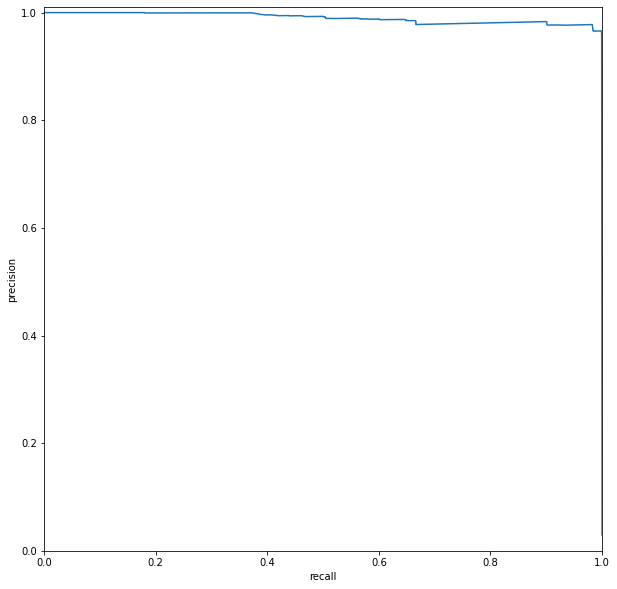

precision:  0.9657864523536165  recall:  0.9991685473334125  F1:  0.9821939401015821  thresholds:  0.010869565217391304


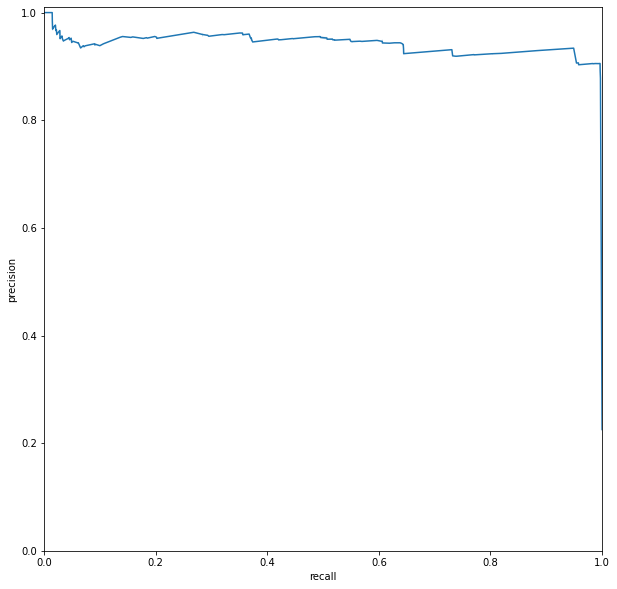

precision:  0.9054649625385632  recall:  0.9966044142614601  F1:  0.9488511719201016  thresholds:  0.010869565217391304


In [14]:
device = torch.device('cuda')
pre,real,weight = evaluation(hdfs_test_normal,hdfs_test_abnormal,device,model_dedup,top =6) #6
_ = with_different_threshold(pre,real,need_plot=True,sample_weight = weight)
_ = with_different_threshold(pre,real,need_plot=True)

# Evaluation

* sample number weighted
* equal weighted

In [ ]:
#Dataset
################
pl.utilities.seed.seed_everything(1)
hdfs_train_sq = hdfs_create_sg(train_set, version=False)
################
hdfs_eval_sq = hdfs_create_sg(random.sample(list(normal.items()),400), version = False)

hdfs_test_normal = hdfs_create_sg(normal, version = False)
hdfs_test_abnormal = hdfs_create_sg(abnormal, version = False)

# Dataloader
train_dataloader = DataLoader(hdfs_train_sq,3072,num_workers=4,collate_fn=collect_function)
eval_dataloader = DataLoader(hdfs_eval_sq,3072,num_workers=4,collate_fn=collect_function)

#+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# model
model = LogOutlier(ntoken = 40, ninp = 16, nhead = 2, nhid = 16 , nlayers = 4, dropout=0.2, padding_value= 36, target_value= 0,
                   learning_rate = 0.01, lr_step_size = 80)


model.to(torch.device('cuda'))
print('model is on cuda')

trainer = Trainer(precision=16,gpus=1,max_epochs= 300)
trainer.fit(model,train_dataloaders= train_dataloader, val_dataloaders = eval_dataloader)

#+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
device = torch.device('cuda')
pre,real,weight = evaluation(hdfs_test_normal,hdfs_test_abnormal,device,model,top =9)


_ = with_different_threshold(pre,real,need_plot=True,sample_weight = weight)
_ = with_different_threshold(pre,real,need_plot=True)

Global seed set to 1
Exception ignored in: <function WeakValueDictionary.__init__.<locals>.remove at 0x7efbee982b00>
Traceback (most recent call last):
  File "/usr/lib/python3.7/weakref.py", line 109, in remove
    def remove(wr, selfref=ref(self), _atomic_removal=_remove_dead_weakref):
KeyboardInterrupt
Using native 16bit precision.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                        | Params
--------------------------------------------------------------------
0 | loss_function       | CrossEntropyLoss            | 0     
1 | encoder             | Embeddings                  | 640   
2 | pos_encoder         | PositionalEncoding          | 0     
3 | transformer_encoder | TransformerEncoderAttention | 6.8 K 
4 | decoder             | Linear                      | 680   
----------------------------------------------------------------

model is on cuda


Exception ignored in: <function _after_fork at 0x7efc7cfda7a0>
Traceback (most recent call last):
  File "/usr/lib/python3.7/threading.py", line 1375, in _after_fork
Exception ignored in: <function _after_fork at 0x7efc7cfda7a0>
Traceback (most recent call last):
    thread._reset_internal_locks(False)
  File "/usr/lib/python3.7/threading.py", line 1375, in _after_fork
  File "/usr/lib/python3.7/threading.py", line 811, in _reset_internal_locks
    thread._reset_internal_locks(False)
  File "/usr/lib/python3.7/threading.py", line 811, in _reset_internal_locks
    self._started._reset_internal_locks()
    self._started._reset_internal_locks()
  File "/usr/lib/python3.7/threading.py", line 505, in _reset_internal_locks
    self._cond.__init__(Lock())
  File "/usr/lib/python3.7/threading.py", line 505, in _reset_internal_locks
  File "/usr/lib/python3.7/threading.py", line 222, in __init__
    self._cond.__init__(Lock())
    self.release = lock.release
KeyboardInterrupt: 
KeyboardInterrup

KeyboardInterrupt: ignored

Global seed set to 1
Global seed set to 1


Global seed set to 1


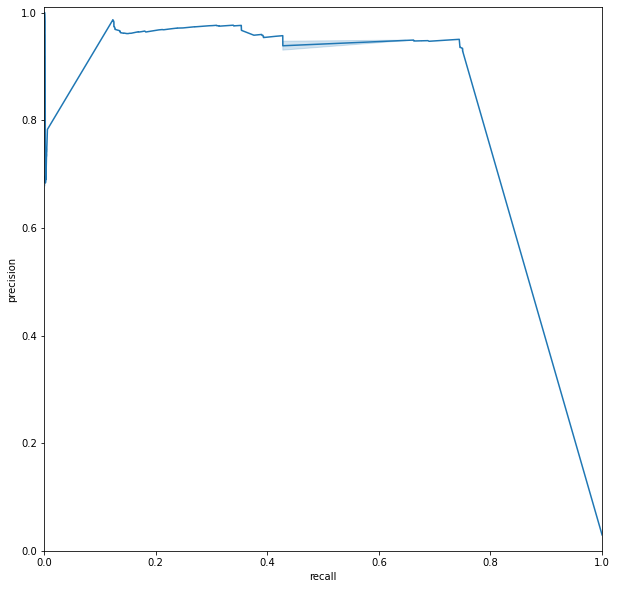

precision:  0.9503147993628157  recall:  0.7440313576434255  F1:  0.8346157689617268  thresholds:  0.013157894736842105


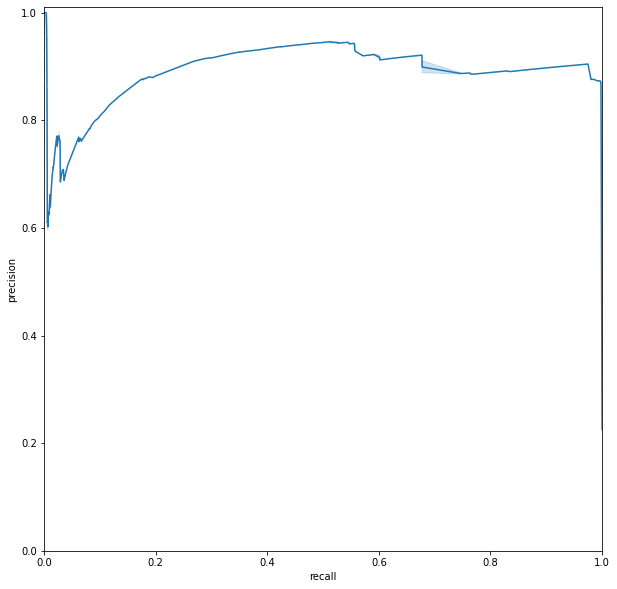

precision:  0.9043654365436543  recall:  0.9747756487994179  F1:  0.9382514299054511  thresholds:  0.013157894736842105


In [ ]:
device = torch.device('cuda')
pre,real,weight = evaluation(hdfs_test_normal,hdfs_test_abnormal,device,model,top =6)


_ = with_different_threshold(pre,real,need_plot=True,sample_weight = weight)
_ = with_different_threshold(pre,real,need_plot=True)

Global seed set to 1
Global seed set to 1


Global seed set to 1


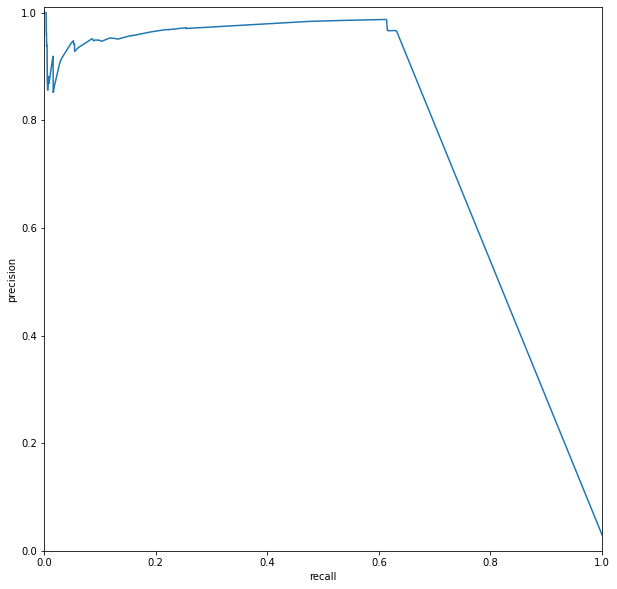

precision:  0.9655986203140601  recall:  0.6317852476541157  F1:  0.7638126009693054  thresholds:  0.009900990099009901


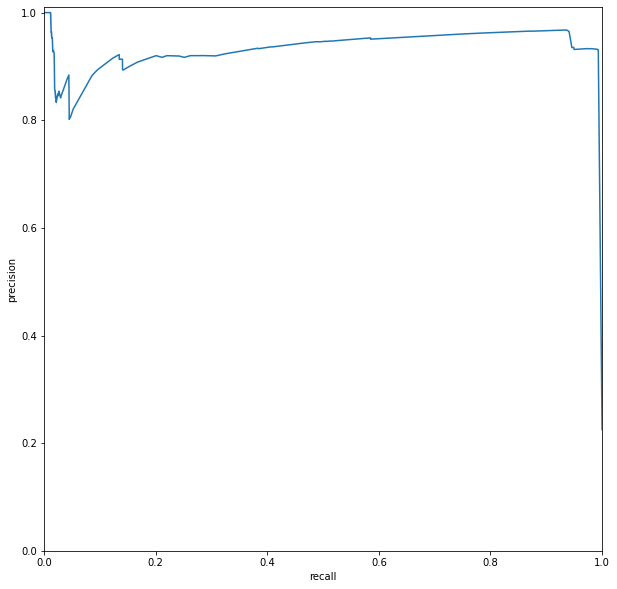

precision:  0.9308933848601955  recall:  0.9932088285229203  F1:  0.9610420089180944  thresholds:  0.009900990099009901


In [ ]:
device = torch.device('cuda')
pre,real,weight = evaluation(hdfs_test_normal,hdfs_test_abnormal,device,model,top =10)


_ = with_different_threshold(pre,real,need_plot=True,sample_weight = weight)
_ = with_different_threshold(pre,real,need_plot=True)

# Dirty version

Global seed set to 1
Using native 16bit precision.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                        | Params
--------------------------------------------------------------------
0 | loss_function       | CrossEntropyLoss            | 0     
1 | encoder             | Embeddings                  | 640   
2 | pos_encoder         | PositionalEncoding          | 0     
3 | transformer_encoder | TransformerEncoderAttention | 6.8 K 
4 | decoder             | Linear                      | 680   
--------------------------------------------------------------------
8.1 K     Trainable params
0         Non-trainable params
8.1 K     Total params
0.032     Total estimated model params size (MB)


model is on cuda


Global seed set to 1


/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/data_loading.py:323: UserWarning: The number of training samples (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  f"The number of training samples ({self.num_training_batches}) is smaller than the logging interval"


Global seed set to 1
Global seed set to 1


Global seed set to 1


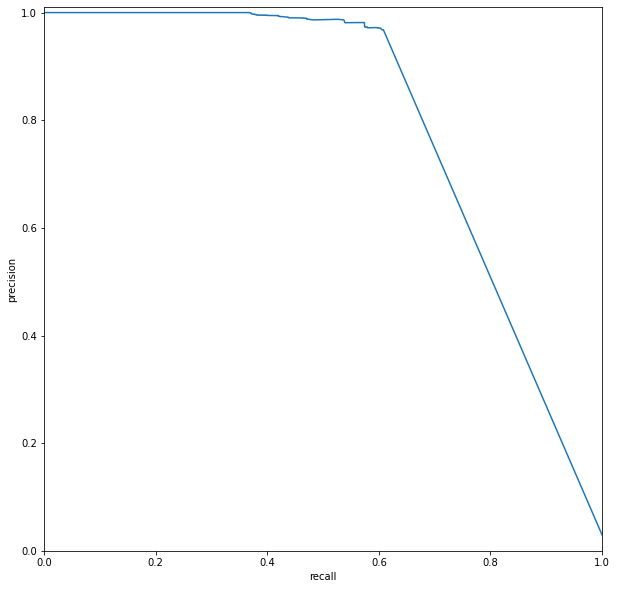

precision:  0.9680408472012103  recall:  0.6080294571801876  F1:  0.7469176333260377  thresholds:  0.006944444444444444


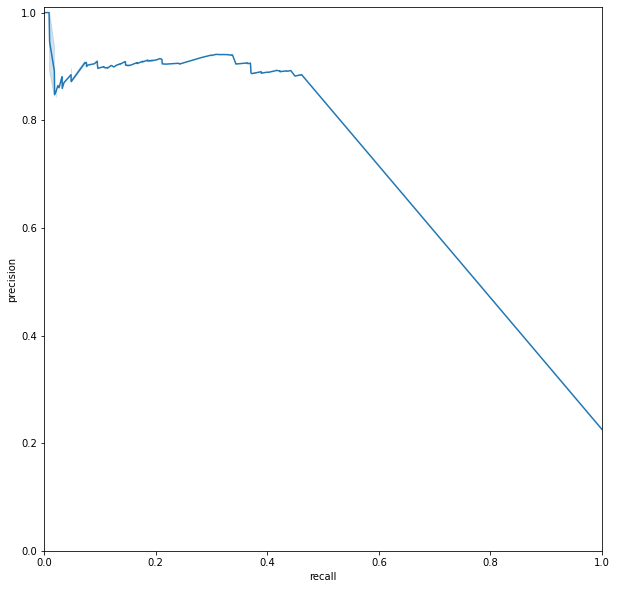

precision:  0.8843474222015791  recall:  0.4617996604414261  F1:  0.6067558954748247  thresholds:  0.006944444444444444


In [ ]:
#Dataset
################
# add 8 random abnormal(1%)
pl.utilities.seed.seed_everything(1)
hdfs_train_sq = hdfs_create_sg(list(train_set.items())+random.sample(list(abnormal.items()),8), version=False)
################
hdfs_eval_sq = hdfs_create_sg(random.sample(list(normal.items()),400), version = False)

hdfs_test_normal = hdfs_create_sg(normal, version = False)
hdfs_test_abnormal = hdfs_create_sg(abnormal, version = False)

# Dataloader
train_dataloader = DataLoader(hdfs_train_sq,3072,num_workers=4,collate_fn=collect_function)
eval_dataloader = DataLoader(hdfs_eval_sq,3072,num_workers=4,collate_fn=collect_function)

#+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# model
model_1 = LogOutlier(ntoken = 40, ninp = 16, nhead = 2, nhid = 16 , nlayers = 4, dropout=0.2, padding_value= 36, target_value= 0,
                   learning_rate = 0.01, lr_step_size = 80)
model_1.to(torch.device('cuda'))
print('model is on cuda')

trainer = Trainer(precision=16,gpus=1,max_epochs= 300)
trainer.fit(model_1,train_dataloaders= train_dataloader, val_dataloaders = eval_dataloader)

#+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
device = torch.device('cuda')
pre,real,weight = evaluation(hdfs_test_normal,hdfs_test_abnormal,device,model_1,top =9)


_ = with_different_threshold(pre,real,need_plot=True,sample_weight = weight)
_ = with_different_threshold(pre,real,need_plot=True)

Global seed set to 1
Using native 16bit precision.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                        | Params
--------------------------------------------------------------------
0 | loss_function       | CrossEntropyLoss            | 0     
1 | encoder             | Embeddings                  | 640   
2 | pos_encoder         | PositionalEncoding          | 0     
3 | transformer_encoder | TransformerEncoderAttention | 6.8 K 
4 | decoder             | Linear                      | 680   
--------------------------------------------------------------------
8.1 K     Trainable params
0         Non-trainable params
8.1 K     Total params
0.032     Total estimated model params size (MB)


model is on cuda


Global seed set to 1


/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/data_loading.py:323: UserWarning: The number of training samples (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  f"The number of training samples ({self.num_training_batches}) is smaller than the logging interval"


Global seed set to 1
Global seed set to 1


Global seed set to 1


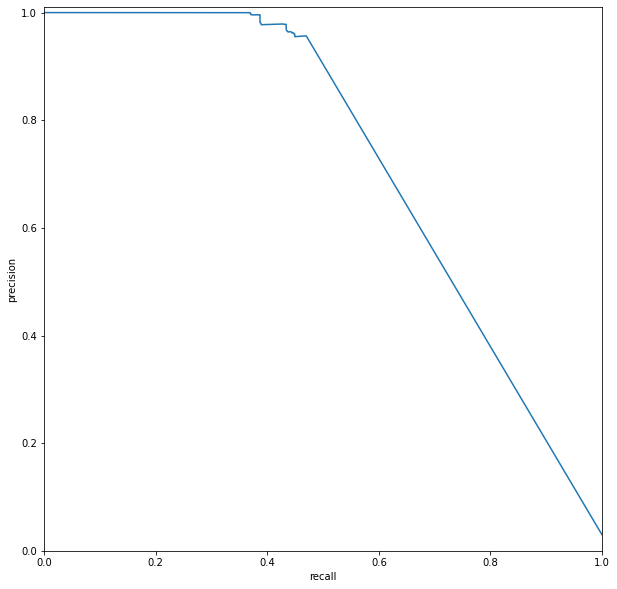

precision:  0.9567057685330753  recall:  0.4698301460981114  F1:  0.6301828175409249  thresholds:  0.006622516556291391


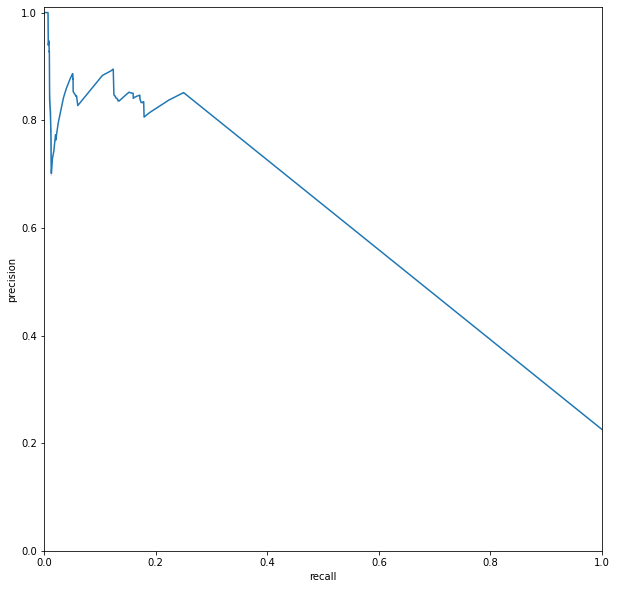

precision:  0.8509060955518946  recall:  0.25054571913655105  F1:  0.38710886265692335  thresholds:  0.006622516556291391


In [ ]:
#Dataset objects
################
# add 16 random abnormal(2%)
pl.utilities.seed.seed_everything(1)
hdfs_train_sq = hdfs_create_sg(list(train_set.items())+random.sample(list(abnormal.items()),16), version=False)
################

hdfs_eval_sq = hdfs_create_sg(random.sample(list(normal.items()),400), version = False)

hdfs_test_normal = hdfs_create_sg(normal, version = False)
hdfs_test_abnormal = hdfs_create_sg(abnormal, version = False)


# Dataloader for training
train_dataloader = DataLoader(hdfs_train_sq,3072,num_workers=4,collate_fn=collect_function)
eval_dataloader = DataLoader(hdfs_eval_sq,3072,num_workers=4,collate_fn=collect_function)


# model
model_2 = LogOutlier(ntoken = 40, ninp = 16, nhead = 2, nhid = 16 , nlayers = 4, dropout=0.2, padding_value= 36, target_value= 0,
                   learning_rate = 0.01, lr_step_size = 80)
model_2.to(torch.device('cuda'))
print('model is on cuda')

trainer = Trainer(precision=16,gpus=1,max_epochs= 300)
trainer.fit(model_2,train_dataloaders= train_dataloader, val_dataloaders = eval_dataloader)

device = torch.device('cuda')
pre,real,weight = evaluation(hdfs_test_normal,hdfs_test_abnormal,device,model_2,top =9)
_ = with_different_threshold(pre,real,need_plot=True,sample_weight = weight)
_ = with_different_threshold(pre,real,need_plot=True)

Global seed set to 1
Using native 16bit precision.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                        | Params
--------------------------------------------------------------------
0 | loss_function       | CrossEntropyLoss            | 0     
1 | encoder             | Embeddings                  | 640   
2 | pos_encoder         | PositionalEncoding          | 0     
3 | transformer_encoder | TransformerEncoderAttention | 6.8 K 
4 | decoder             | Linear                      | 680   
--------------------------------------------------------------------
8.1 K     Trainable params
0         Non-trainable params
8.1 K     Total params
0.032     Total estimated model params size (MB)


model is on cuda


Global seed set to 1


/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/data_loading.py:323: UserWarning: The number of training samples (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  f"The number of training samples ({self.num_training_batches}) is smaller than the logging interval"


Global seed set to 1
Global seed set to 1


Global seed set to 1


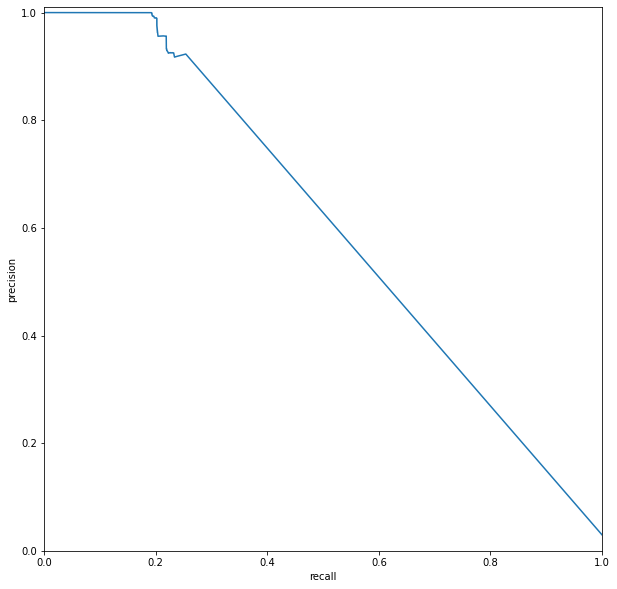

precision:  0.9229607250755287  recall:  0.25400878964247536  F1:  0.39837928464977646  thresholds:  0.006944444444444444


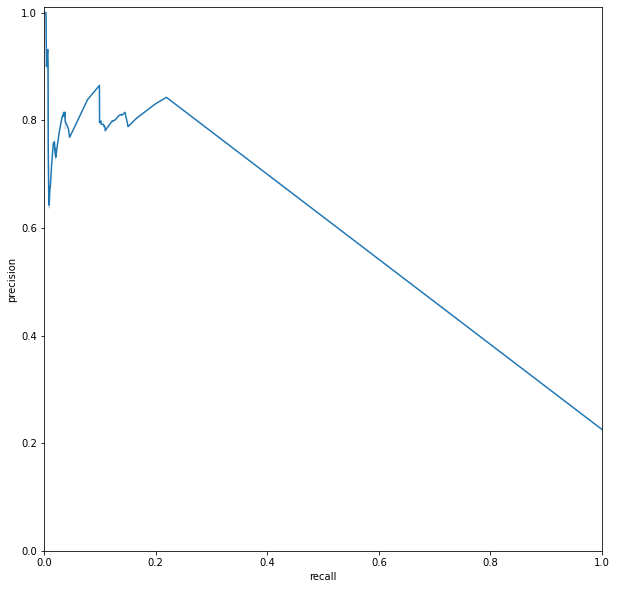

precision:  0.22530054644808742  recall:  1.0  F1:  0.36774740222093383  thresholds:  0.0


In [ ]:
#Dataset objects
################
# add 40 random abnormal(5%)
pl.utilities.seed.seed_everything(1)
hdfs_train_sq = hdfs_create_sg(list(train_set.items())+random.sample(list(abnormal.items()),40), version=False)
################

hdfs_eval_sq = hdfs_create_sg(random.sample(list(normal.items()),400), version = False)

hdfs_test_normal = hdfs_create_sg(normal, version = False)
hdfs_test_abnormal = hdfs_create_sg(abnormal, version = False)


# Dataloader for training
train_dataloader = DataLoader(hdfs_train_sq,3072,num_workers=4,collate_fn=collect_function)
eval_dataloader = DataLoader(hdfs_eval_sq,3072,num_workers=4,collate_fn=collect_function)


# model
model_5 = LogOutlier(ntoken = 40, ninp = 16, nhead = 2, nhid = 16 , nlayers = 4, dropout=0.2, padding_value= 36, target_value= 0,
                   learning_rate = 0.01, lr_step_size = 80)
model_5.to(torch.device('cuda'))
print('model is on cuda')

trainer = Trainer(precision=16,gpus=1,max_epochs= 300)
trainer.fit(model_5,train_dataloaders= train_dataloader, val_dataloaders = eval_dataloader)

device = torch.device('cuda')
pre,real,weight = evaluation(hdfs_test_normal,hdfs_test_abnormal,device,model_5,top =9)
_ = with_different_threshold(pre,real,need_plot=True,sample_weight = weight)
_ = with_different_threshold(pre,real,need_plot=True)

Global seed set to 1
Using native 16bit precision.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                        | Params
--------------------------------------------------------------------
0 | loss_function       | CrossEntropyLoss            | 0     
1 | encoder             | Embeddings                  | 640   
2 | pos_encoder         | PositionalEncoding          | 0     
3 | transformer_encoder | TransformerEncoderAttention | 6.8 K 
4 | decoder             | Linear                      | 680   
--------------------------------------------------------------------
8.1 K     Trainable params
0         Non-trainable params
8.1 K     Total params
0.032     Total estimated model params size (MB)


model is on cuda


Global seed set to 1


/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/data_loading.py:323: UserWarning: The number of training samples (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  f"The number of training samples ({self.num_training_batches}) is smaller than the logging interval"


Global seed set to 1
Global seed set to 1


Global seed set to 1


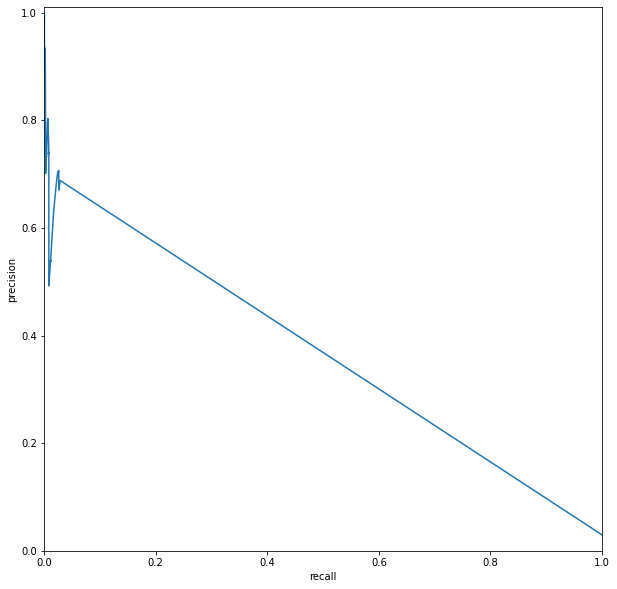

precision:  0.029529782323519303  recall:  1.0  F1:  0.05736557179895136  thresholds:  0.0


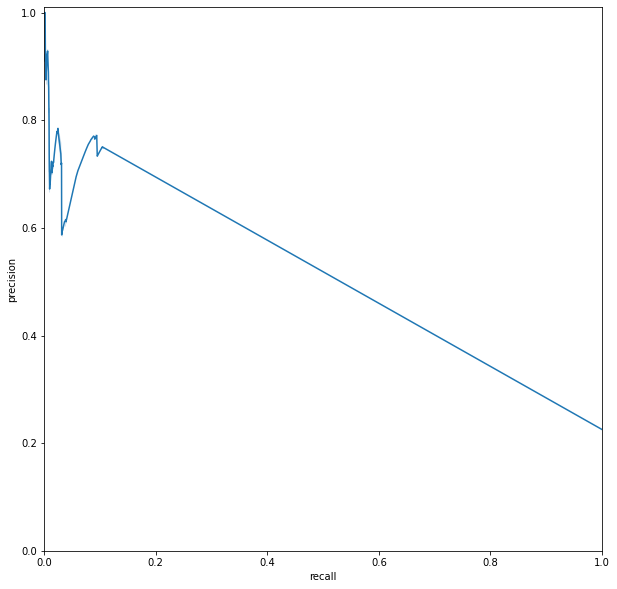

precision:  0.22530054644808742  recall:  1.0  F1:  0.36774740222093383  thresholds:  0.0


In [ ]:
#Dataset objects
################
# add 80 random abnormal(10%)
pl.utilities.seed.seed_everything(1)
hdfs_train_sq = hdfs_create_sg(list(train_set.items())+random.sample(list(abnormal.items()),80), version=False)
################

hdfs_eval_sq = hdfs_create_sg(random.sample(list(normal.items()),400), version = False)

hdfs_test_normal = hdfs_create_sg(normal, version = False)
hdfs_test_abnormal = hdfs_create_sg(abnormal, version = False)


# Dataloader for training
train_dataloader = DataLoader(hdfs_train_sq,3072,num_workers=4,collate_fn=collect_function)
eval_dataloader = DataLoader(hdfs_eval_sq,3072,num_workers=4,collate_fn=collect_function)


# model
model_10 = LogOutlier(ntoken = 40, ninp = 16, nhead = 2, nhid = 16 , nlayers = 4, dropout=0.2, padding_value= 36, target_value= 0,
                   learning_rate = 0.01, lr_step_size = 80)
model_10.to(torch.device('cuda'))
print('model is on cuda')

trainer = Trainer(precision=16,gpus=1,max_epochs= 300)
trainer.fit(model_10,train_dataloaders= train_dataloader, val_dataloaders = eval_dataloader)

device = torch.device('cuda')
pre,real,weight = evaluation(hdfs_test_normal,hdfs_test_abnormal,device,model_10,top =9)
_ = with_different_threshold(pre,real,need_plot=True,sample_weight = weight)
_ = with_different_threshold(pre,real,need_plot=True)

In [ ]:
# Attention visualisation 

# get hdfs token dict
import re
with open('/content/drive/MyDrive/hdfs/col_header.txt') as data:
    for i in data:
        tokens = i

tokens = re.split('\t',tokens)
token_dict = {0: 'query token', 36: 'padding token', 37: 'start token', 
              38: 'end token'}
for i in range(29):
    token_dict[i+1] = re.split('[0-9].',tokens[i])[1]

# special view function for hdfs
def view(tensors, token_dict):
    tensors = tensors[tensors!=36]
    tensors = tensors.unsqueeze(0)
    _,attention = model(tensors,tensors==36,require_attention=True)
    _token = [token_dict[i] for i in tensors[0].tolist()]
    head_view(attention,_token)

# view
for i in train_dataloader:
    batch_data = i
view(batch_data[0][301],token_dict)
head_view(b,[str(i) for i in i[0][3].tolist()])
#The lines show the attention from each token (left) to every other token (right)